In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ast
from sqlalchemy import create_engine
# from matplotlib.patches import Polygon
from pybaseball.plotting import spraychart
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import warnings

# Suppress the SettingWithCopyWarning
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)

Pulling additional statistics about the swings:
- Acceleration
- Max Speed
- time to reach max speed
- Contact time with ball
- Follow through after contact
- Angular velocity
- Angle of attack
- Bat path consistency relative to central plane of motion
- Relationship of any of these to game outcomes

In [2]:
sqlite_file = '../../wisd_data.db'

engine = create_engine(f'sqlite:///{sqlite_file}')

# Read data from SQLite database
pitch_df = pd.read_sql('pitch_data', engine)
hit_df = pd.read_sql('hit_data', engine)
score_df = pd.read_sql('score_data', engine)
events_df = pd.read_sql('events_data', engine)
ball_samples_df = pd.read_sql('ball_samples_data', engine)
bat_samples_df = pd.read_sql('bat_samples_data', engine)


score_df['runs_innings_team1'] = score_df['runs_innings_team1'].apply(ast.literal_eval)
score_df['inning'] = score_df['runs_innings_team1'].apply(lambda x: len(x))

def get_inning(pitch_eventId):
    return score_df[score_df['pitch_eventId'] == pitch_eventId]['inning'].values[0]

events_df['inning'] = events_df['pitch_eventId'].apply(lambda x: get_inning(x))

In [3]:
hitter_dict = {}
for personId, df in events_df.groupby('personId_mlbId'):
    hitter_dict[personId] = list(df['pitch_eventId'].values)

In [4]:
hitter_dict.keys()

dict_keys([172804761, 174158975, 223971350, 290569727, 352830460, 360906992, 412098649, 432216743, 451871192, 459722179, 474808052, 485007791, 505414610, 518481551, 545569723, 558675411, 563942271, 568527038, 590082479, 617522563, 618024297, 654287703, 686425745, 719146721, 719210239, 765710437, 797796542, 797957728, 805688901, 849653732, 854238128])

In [5]:
# question about 'HIT' in event column -- before first and last timestamp + 0,0,0
def get_swing_df(bat_samples_df, pitchEvent_ID):
    pitchEvent_df = bat_samples_df[bat_samples_df['pitch_eventId']==pitchEvent_ID].sort_values('time')
    # Find the index positions of 'first' and the last occurrence of 'last' or 'hit'
    start_index = pitchEvent_df[pitchEvent_df['event'] == 'First'].index[0]
    end_index = pitchEvent_df[(pitchEvent_df['event'] == 'Last')].index[-1]

    # Extract the rows between 'first' and the last 'last' or 'hit'
    swing_df = pitchEvent_df.loc[start_index:end_index]
    return swing_df


In [6]:
# # Calculate speed (magnitude of velocity)
# swing_df['head_speed'] = np.sqrt(swing_df['head_pos_x'].diff()**2 + swing_df['head_pos_y'].diff()**2 + swing_df['head_pos_z'].diff()**2) / swing_df['time'].diff()
# swing_df['handle_speed'] = np.sqrt(swing_df['handle_pos_x'].diff()**2 + swing_df['handle_pos_y'].diff()**2 + swing_df['handle_pos_z'].diff()**2) / swing_df['time'].diff()

# # Calculate acceleration
# swing_df['head_acceleration'] = swing_df['head_speed'].diff() / swing_df['time'].diff()
# swing_df['handle_acceleration'] = swing_df['handle_speed'].diff() / swing_df['time'].diff()

# # Find max speed and time to reach max speed
# max_head_speed = swing_df['head_speed'].max()
# time_to_max_head_speed = swing_df.loc[swing_df['head_speed'].idxmax(), 'time']

# max_handle_speed = swing_df['handle_speed'].max()
# time_to_max_handle_speed = swing_df.loc[swing_df['handle_speed'].idxmax(), 'time']

# # Calculate angular velocity
# # Using the formula ω = v / r where v is the tangential speed and r is the radius
# swing_df['angular_velocity'] = swing_df['handle_speed'] / np.sqrt(swing_df['handle_pos_x']**2 + swing_df['handle_pos_y']**2)

# # Calculate angle of attack (angle between head and handle trajectory)
# swing_df['head_vector'] = swing_df.apply(lambda row: np.array([row['head_pos_x'], row['head_pos_y'], row['head_pos_z']]), axis=1)
# swing_df['handle_vector'] = swing_df.apply(lambda row: np.array([row['handle_pos_x'], row['handle_pos_y'], row['handle_pos_z']]), axis=1)
# swing_df['dot_product'] = swing_df.apply(lambda row: np.dot(row['head_vector'], row['handle_vector']), axis=1)
# swing_df['head_magnitude'] = swing_df.apply(lambda row: np.linalg.norm(row['head_vector']), axis=1)
# swing_df['handle_magnitude'] = swing_df.apply(lambda row: np.linalg.norm(row['handle_vector']), axis=1)
# swing_df['cos_angle'] = swing_df['dot_product'] / (swing_df['head_magnitude'] * swing_df['handle_magnitude'])
# swing_df['angle_of_attack'] = np.arccos(swing_df['cos_angle'])

# # Display results
# print("Max Head Speed:", max_head_speed)
# print("Time to Reach Max Head Speed:", time_to_max_head_speed)
# print("Max Handle Speed:", max_handle_speed)
# print("Time to Reach Max Handle Speed:", time_to_max_handle_speed)
# print("Angular Velcoity")
# plt.figure()
# plt.plot(swing_df['time'], swing_df['angular_velocity'])
# plt.title('Angular Velocity')
# plt.xlabel('Time (s)')
# plt.ylabel('Angular Velocity (rad/s)')
# plt.show()

# print("Angle of Attack")
# plt.figure()
# swing_df['angle_of_attack'].hist()
# # plt.plot(swing_df['time'], swing_df['angle_of_attack'])
# plt.title('Angle of Attack')
# # plt.xlabel('Time (s)')
# # plt.ylabel('Angle of Attack (rad)')
# plt.show()

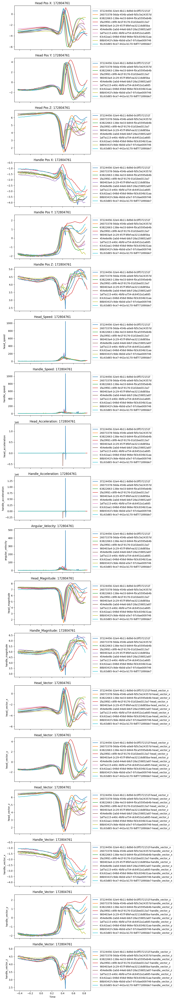

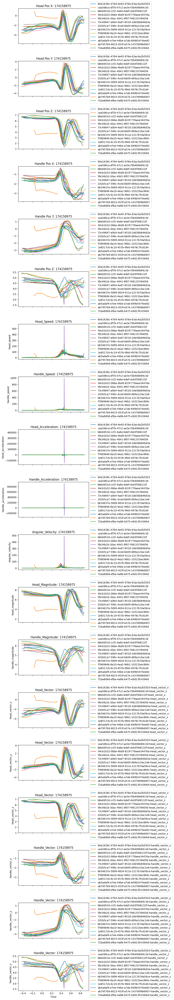

/Users/vrose/Desktop/Main/WISD/VENV/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in arccos
  result = getattr(ufunc, method)(*inputs, **kwargs)


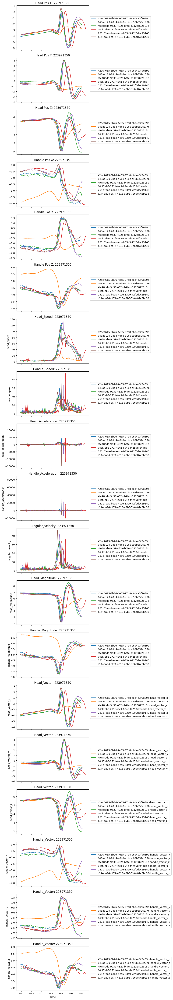

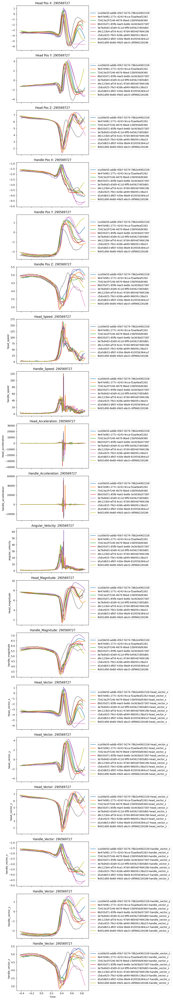

In [14]:
def get_swing_df(bat_samples_df, pitchEvent_ID):
    pitchEvent_df = bat_samples_df[bat_samples_df['pitch_eventId'] == pitchEvent_ID].sort_values('time')
    if pitchEvent_df.empty:
        return pd.DataFrame()  # Return an empty DataFrame if no data is found

    # Find the index positions of 'First' and the last occurrence of 'Last' or 'Hit'
    if 'event' in pitchEvent_df.columns:
        start_index = pitchEvent_df[pitchEvent_df['event'] == 'First'].index[0]
        end_index = pitchEvent_df[(pitchEvent_df['event'] == 'Last')].index[-1]
        # Extract the rows between 'First' and 'Last'
        swing_df = pitchEvent_df.loc[start_index:end_index]
    else:
        swing_df = pitchEvent_df  # If 'event' column does not exist, return the whole df

        # Calculate speed (magnitude of velocity)
    swing_df['head_speed'] = np.sqrt(swing_df['head_pos_x'].diff()**2 + swing_df['head_pos_y'].diff()**2 + swing_df['head_pos_z'].diff()**2) / swing_df['time'].diff()
    swing_df['handle_speed'] = np.sqrt(swing_df['handle_pos_x'].diff()**2 + swing_df['handle_pos_y'].diff()**2 + swing_df['handle_pos_z'].diff()**2) / swing_df['time'].diff()

    # Calculate acceleration
    swing_df['head_acceleration'] = swing_df['head_speed'].diff() / swing_df['time'].diff()
    swing_df['handle_acceleration'] = swing_df['handle_speed'].diff() / swing_df['time'].diff()

    # Find max speed and time to reach max speed
    max_head_speed = swing_df['head_speed'].max()
    time_to_max_head_speed = swing_df.loc[swing_df['head_speed'].idxmax(), 'time']

    max_handle_speed = swing_df['handle_speed'].max()
    time_to_max_handle_speed = swing_df.loc[swing_df['handle_speed'].idxmax(), 'time']

    # Calculate angular velocity
    # Using the formula ω = v / r where v is the tangential speed and r is the radius
    swing_df['angular_velocity'] = swing_df['handle_speed'] / np.sqrt(swing_df['handle_pos_x']**2 + swing_df['handle_pos_y']**2)

    # Calculate angle of attack (angle between head and handle trajectory)
    swing_df['head_vector'] = swing_df.apply(lambda row: np.array([row['head_pos_x'], row['head_pos_y'], row['head_pos_z']]), axis=1)
    swing_df['handle_vector'] = swing_df.apply(lambda row: np.array([row['handle_pos_x'], row['handle_pos_y'], row['handle_pos_z']]), axis=1)
    swing_df['dot_product'] = swing_df.apply(lambda row: np.dot(row['head_vector'], row['handle_vector']), axis=1)
    swing_df['head_magnitude'] = swing_df.apply(lambda row: np.linalg.norm(row['head_vector']), axis=1)
    swing_df['handle_magnitude'] = swing_df.apply(lambda row: np.linalg.norm(row['handle_vector']), axis=1)
    swing_df['cos_angle'] = swing_df['dot_product'] / (swing_df['head_magnitude'] * swing_df['handle_magnitude'])
    swing_df['angle_of_attack'] = np.arccos(swing_df['cos_angle'])

    # Display results
    # print("Max Head Speed:", max_head_speed)
    # print("Time to Reach Max Head Speed:", time_to_max_head_speed)
    # print("Max Handle Speed:", max_handle_speed)
    # print("Time to Reach Max Handle Speed:", time_to_max_handle_speed)
    # print("Angular Velcoity")
    # plt.figure()
    # plt.plot(swing_df['time'], swing_df['angular_velocity'])
    # plt.title('Angular Velocity')
    # plt.xlabel('Time (s)')
    # plt.ylabel('Angular Velocity (rad/s)')
    # plt.show()

    # print("Angle of Attack")
    # plt.figure()
    # swing_df['angle_of_attack'].hist()
    # # plt.plot(swing_df['time'], swing_df['angle_of_attack'])
    # plt.title('Angle of Attack')
    # # plt.xlabel('Time (s)')
    # # plt.ylabel('Angle of Attack (rad)')
    # plt.show()
    return swing_df

def plot_swing_comparison(hitter_dict, bat_samples_df):
    # List of columns to plot
    columns_to_plot = [
        'head_pos_x', 'head_pos_y', 'head_pos_z', 'handle_pos_x', 'handle_pos_y',
        'handle_pos_z', 'head_speed', 'handle_speed', 'head_acceleration',
        'handle_acceleration', 'angular_velocity', 'head_vector', 'handle_vector', 'head_magnitude', 'handle_magnitude'
    ]

    # Calculate the number of plots needed
    num_gathered_plots = 2  # head_pos and handle_pos
    num_vector_plots = 2 * 3  # head_vector and handle_vector each have 3 components (_x, _y, _z)
    num_individual_plots = len(columns_to_plot) - num_gathered_plots - 2  # excluding the gathered and vector columns

    num_plots = num_gathered_plots + num_vector_plots + num_individual_plots

    
    

    # Plot each column for the separate pitches together

    n_players = 0
    for player_id, pitch_event_ids in hitter_dict.items():
        fig, axes = plt.subplots(num_plots, 1, figsize=(10, 3 * num_plots), sharex=True)
        for pitch_event_id in pitch_event_ids:
            current_plot = 0
            swing_df = get_swing_df(bat_samples_df, pitch_event_id)

            if not swing_df.empty:
                axes[current_plot].plot(swing_df['time'], swing_df['head_pos_x'], label=f'{pitch_event_id}')
                axes[current_plot].set_title(f'Head Pos X: {player_id}')
                axes[current_plot + 1].plot(swing_df['time'], swing_df['head_pos_y'], label=f'{pitch_event_id}')
                axes[current_plot + 1].set_title(f'Head Pos Y: {player_id}')
                axes[current_plot + 2].plot(swing_df['time'], swing_df['head_pos_z'], label=f'{pitch_event_id}')
                axes[current_plot + 2].set_title(f'Head Pos Z: {player_id}')
                axes[current_plot + 3].plot(swing_df['time'], swing_df['handle_pos_x'], label=f'{pitch_event_id}')
                axes[current_plot + 3].set_title(f'Handle Pos X: {player_id}')
                axes[current_plot + 4].plot(swing_df['time'], swing_df['handle_pos_y'], label=f'{pitch_event_id}')
                axes[current_plot + 4].set_title(f'Handle Pos Y: {player_id}')
                axes[current_plot + 5].plot(swing_df['time'], swing_df['handle_pos_z'], label=f'{pitch_event_id}')
                axes[current_plot + 5].set_title(f'Handle Pos Z: {player_id}')
                current_plot += 6


                for column in columns_to_plot:
                    if column not in ['head_pos_x', 'head_pos_y', 'head_pos_z', 'handle_pos_x', 'handle_pos_y', 'handle_pos_z', 'head_vector', 'handle_vector']:
                        if column in swing_df.columns:
                            axes[current_plot].plot(swing_df['time'], swing_df[column], label=f'{pitch_event_id}')
                            axes[current_plot].set_ylabel(column)
                            axes[current_plot].set_title(f'{column.title()}: {player_id}')
                            axes[current_plot].legend(loc='center left', bbox_to_anchor=(1, 0.5))
                            current_plot += 1

                # Plot vector components
                for vector_column in ['head_vector', 'handle_vector']:
                    if vector_column in swing_df.columns:
                        for i, axis in enumerate(['_x', '_y', '_z']):
                            axes[current_plot].plot(swing_df['time'], swing_df[vector_column].apply(lambda x: x[i]), label=f'{pitch_event_id}-{vector_column}{axis}')
                            axes[current_plot].set_ylabel(f'{vector_column}{axis}')
                            axes[current_plot].set_title(f'{vector_column.title()}: {player_id}')
                            axes[current_plot].legend(loc='center left', bbox_to_anchor=(1, 0.5))
                            current_plot += 1

        for idx in range(0,6):
            axes[idx].legend(loc='center left', bbox_to_anchor=(1, 0.5))
         # Set common x-axis label
        axes[-1].set_xlabel('Time')

        # Adjust layout
        # plt.suptitle(f'Player ID: {player_id}')
        plt.tight_layout()
        
        plt.show()

        n_players += 1
        if n_players > 3:
            break

# Plot the swing comparisons
plot_swing_comparison(hitter_dict, bat_samples_df)


In [5]:
def plot_at_bat(pitch_eventId, bat_samples_df):
    df = bat_samples_df[bat_samples_df['pitch_eventId'] == pitch_eventId].copy()

    # Fit polynomial curves for each position coordinate
    def fit_polynomial(time, position, degree=3):
        poly = PolynomialFeatures(degree)
        time_poly = poly.fit_transform(time.reshape(-1, 1))
        model = LinearRegression().fit(time_poly, position)
        return model, poly

    # Extract time and position data
    time = df['time'].values
    # head_pos_x = df['head_pos_x'].values
    # head_pos_y = df['head_pos_y'].values
    # head_pos_z = df['head_pos_z'].values

    # handle_pos_x = df['handle_pos_x'].values
    # handle_pos_y = df['handle_pos_y'].values
    # handle_pos_z = df['handle_pos_z'].values

    models_head = {}
    models_handle = {}

    for coord in ['x', 'y', 'z']:
        models_head[coord], _ = fit_polynomial(time, df[f'head_pos_{coord}'].values)
        models_handle[coord], _ = fit_polynomial(time, df[f'handle_pos_{coord}'].values)

    # Predict values for visualization
    time_new = np.linspace(time.min(), time.max(), 100)
    time_new_poly = PolynomialFeatures(degree=3).fit_transform(time_new.reshape(-1, 1))

    head_pos_x_pred = models_head['x'].predict(time_new_poly)
    head_pos_y_pred = models_head['y'].predict(time_new_poly)
    head_pos_z_pred = models_head['z'].predict(time_new_poly)

    handle_pos_x_pred = models_handle['x'].predict(time_new_poly)
    handle_pos_y_pred = models_handle['y'].predict(time_new_poly)
    handle_pos_z_pred = models_handle['z'].predict(time_new_poly)

    # Plotting
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111, projection='3d')

    # Plot head trajectory
    ax.plot(head_pos_x_pred, head_pos_y_pred, head_pos_z_pred, label='Head Trajectory', color='b')

    # Plot handle trajectory
    ax.plot(handle_pos_x_pred, handle_pos_y_pred, handle_pos_z_pred, label='Handle Trajectory', color='r')

    ax.set_xlabel('X Position')
    ax.set_ylabel('Y Position')
    ax.set_zlabel('Z Position')
    ax.set_title(pitch_eventId)
    ax.legend()

    plt.show()

In [61]:

bat_samples_df[bat_samples_df['pitch_eventId']=='043ae129-28d4-46b3-a1bc-c98b859cc776']

,pitch_eventId,hit_eventId,event,time,head_pos_x,head_pos_y,head_pos_z,handle_pos_x,handle_pos_y,handle_pos_z
30694,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,Hit,-2.560901,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
30695,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,First,-0.398996,-3.905020,-0.609139,5.483259,-3.905020,-0.609139,5.483259
30696,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,None,-0.395664,-3.902184,-0.608970,5.481382,-3.902184,-0.608970,5.481382
30697,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,None,-0.392331,-3.898783,-0.608538,5.480574,-3.898783,-0.608538,5.480574
30698,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,None,-0.388997,-3.894856,-0.607812,5.480813,-3.894856,-0.607812,5.480813
...,...,...,...,...,...,...,...,...,...,...
31054,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,None,0.797577,-2.750674,-1.019454,5.186642,-2.750674,-1.019454,5.186642
31055,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,None,0.800910,-2.754508,-1.022927,5.194197,-2.754508,-1.022927,5.194197
31056,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,None,0.804242,-2.758651,-1.025855,5.201377,-2.758651,-1.025855,5.201377
31057,043ae129-28d4-46b3-a1bc-c98b859cc776,d2093734-cd5a-4c58-9705-91186c0e61a7,None,0.807576,-2.763095,-1.028297,5.208204,-2.763095,-1.028297,5.208204


In [7]:
playerId = 223971350
for pitch_eventId, df in bat_samples_df[bat_samples_df['pitch_eventId'].isin(hitter_dict[playerId])].groupby('pitch_eventId'):
    print(pitch_eventId)
    # plot_at_bat(pitch_eventId, df)

043ae129-28d4-46b3-a1bc-c98b859cc776
04cf7eb8-271f-4ac1-894d-f4259dfb4ada
251b7aaa-baaa-4ca6-83e9-72f0dac19140
42ac4615-8b26-4e55-97b8-c6d4a3f9e89b
4fe48dda-9b39-432e-b4fe-b1126822613c
c144ba94-df74-4813-a9b8-7e6a87c8bc33


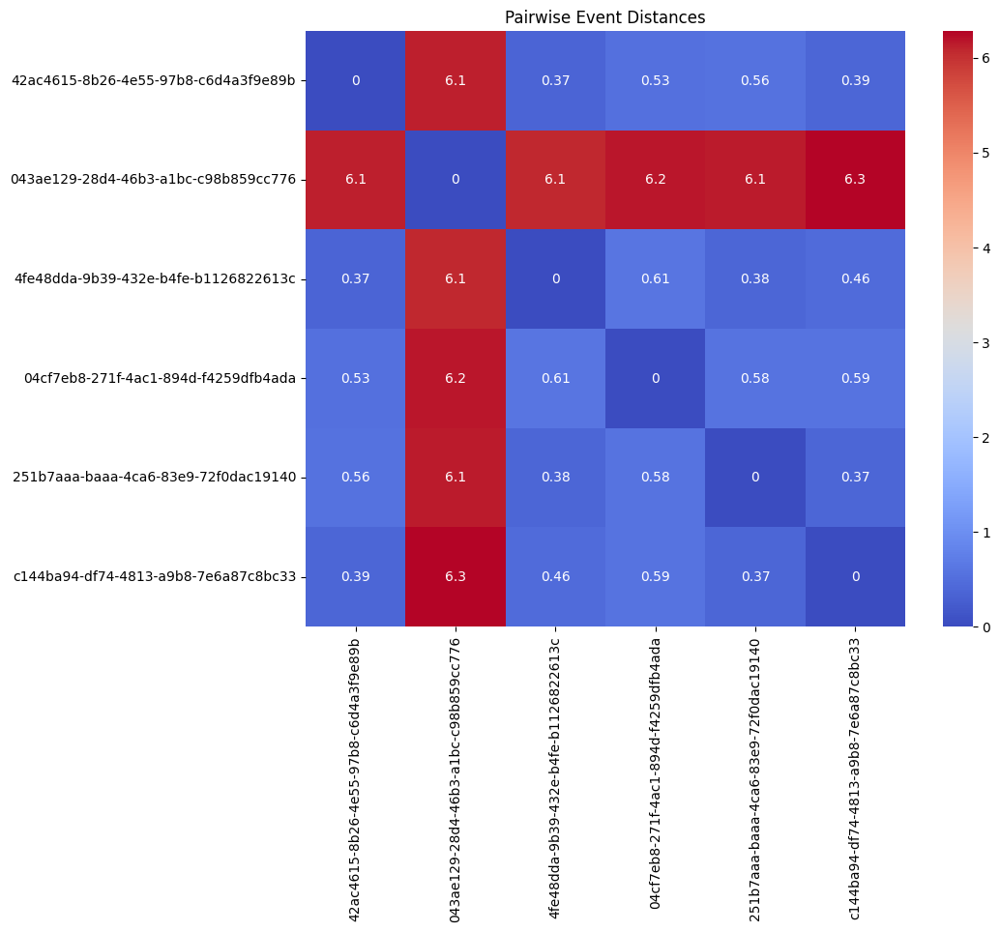

In [11]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw
import matplotlib.pyplot as plt
import seaborn as sns


# Function to extract features
def extract_features(df, part='head'):
    features = {}
    events = df['pitch_eventId'].unique()
    for event in events:
        subset = df[df['pitch_eventId'] == event]
        features[event] = {
            'mean_x': subset[f'{part}_pos_x'].mean(),
            'mean_y': subset[f'{part}_pos_y'].mean(),
            'mean_z': subset[f'{part}_pos_z'].mean(),
            'var_x': subset[f'{part}_pos_x'].var(),
            'var_y': subset[f'{part}_pos_y'].var(),
            'var_z': subset[f'{part}_pos_z'].var(),
            'length': np.sqrt((np.diff(subset[f'{part}_pos_x'])**2 + np.diff(subset[f'{part}_pos_y'])**2 + np.diff(subset[f'{part}_pos_z'])**2).sum())
        }
    return pd.DataFrame(features).T

# Extract features
df = bat_samples_df[bat_samples_df['pitch_eventId'].isin(hitter_dict[playerId])]
features_df = extract_features(df, part='handle')

# Function to compute pairwise distances
def compute_pairwise_distances(df, method='euclidean'):
    events = df.index
    n = len(events)
    distances = np.zeros((n, n))
    
    for i in range(n):
        for j in range(i+1, n):
            if method == 'euclidean':
                distances[i, j] = euclidean(df.iloc[i].values, df.iloc[j].values)
                distances[j, i] = distances[i, j]
            elif method == 'dtw':
                x1 = df.iloc[i].values
                x2 = df.iloc[j].values
                distances[i, j], _ = fastdtw(x1, x2, dist=euclidean)
                distances[j, i] = distances[i, j]
    
    return pd.DataFrame(distances, index=events, columns=events)

# Compute pairwise distances
distance_matrix = compute_pairwise_distances(features_df, method='euclidean')

# Plot the distance matrix
plt.figure(figsize=(10, 8))
sns.heatmap(distance_matrix, annot=True, cmap='coolwarm')
plt.title('Pairwise Event Distances')
plt.show()


043ae129-28d4-46b3-a1bc-c98b859cc776


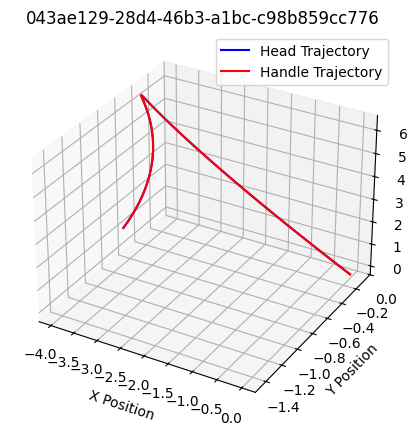

04cf7eb8-271f-4ac1-894d-f4259dfb4ada


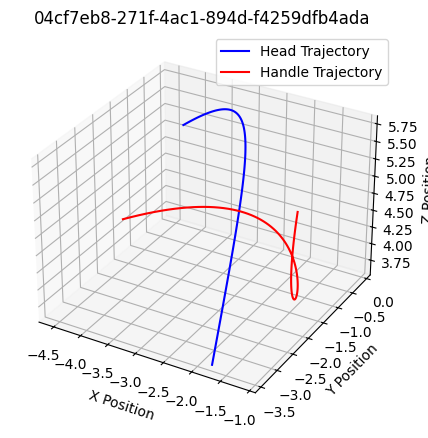

251b7aaa-baaa-4ca6-83e9-72f0dac19140


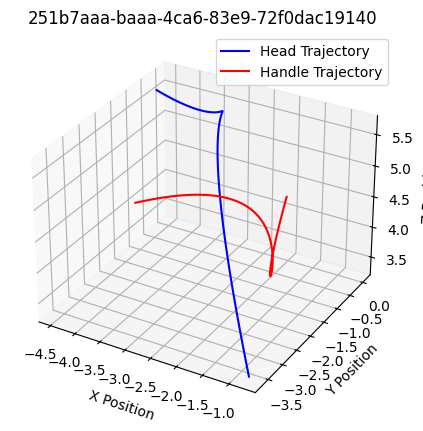

42ac4615-8b26-4e55-97b8-c6d4a3f9e89b


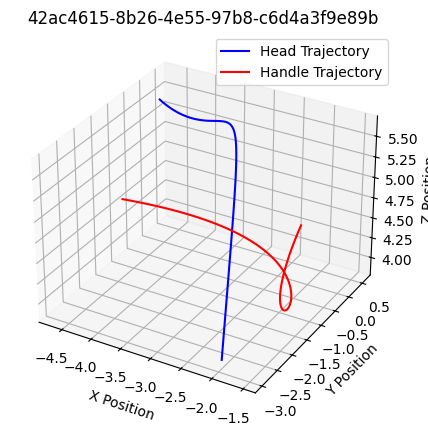

4fe48dda-9b39-432e-b4fe-b1126822613c


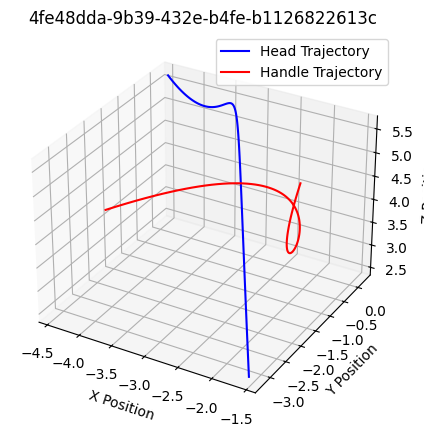

c144ba94-df74-4813-a9b8-7e6a87c8bc33


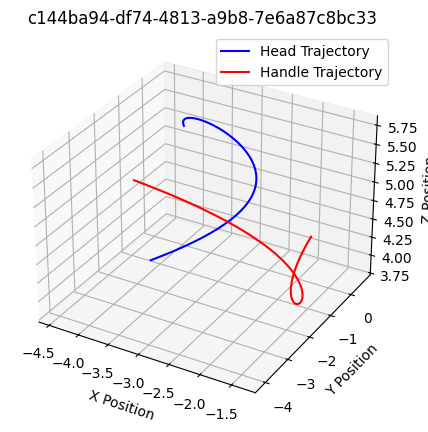

In [60]:
playerId = 223971350
for pitch_eventId, df in bat_samples_df[bat_samples_df['pitch_eventId'].isin(hitter_dict[playerId])].groupby('pitch_eventId'):
    print(pitch_eventId)
    plot_at_bat(pitch_eventId, df)